In [3]:
# mount gdrive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


File size: 463520 bytes
Resizing image from (1325, 1981) to (1024,1024)
blob size 1398101 bytes.


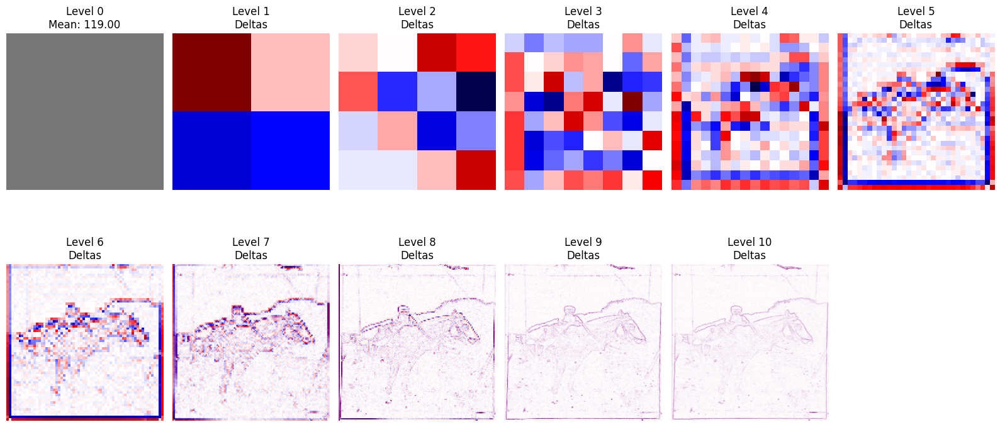

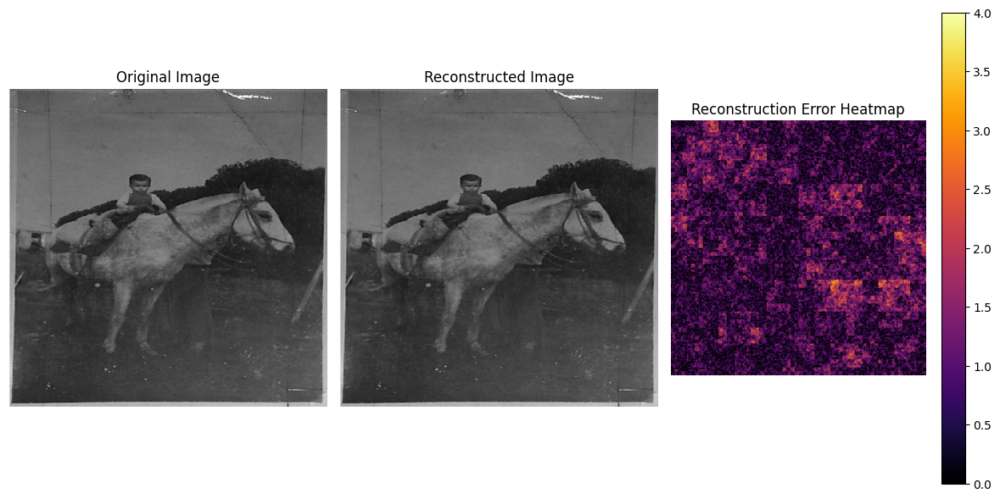

Mean absolute reconstruction error (MAE): 0.713322
Mean squared reconstruction error (MSRE): 0.952156
Quantization 8 bits per sample
blob size 1398191 bytes Quantized.


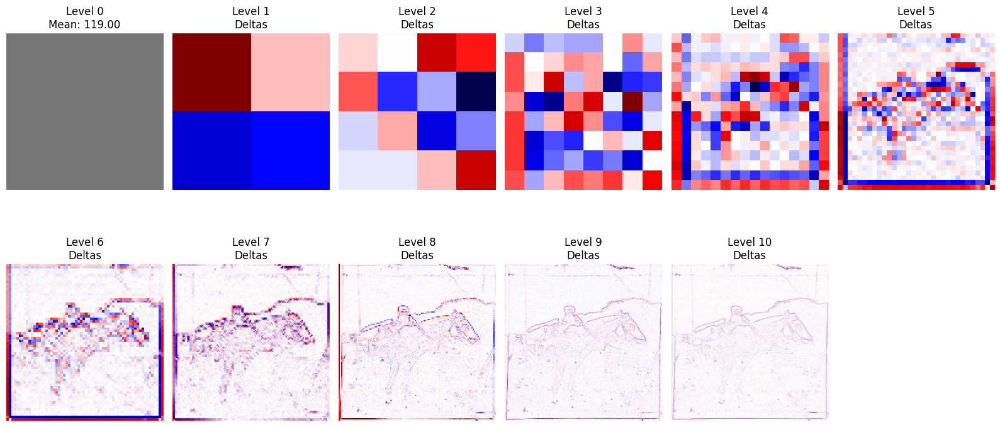

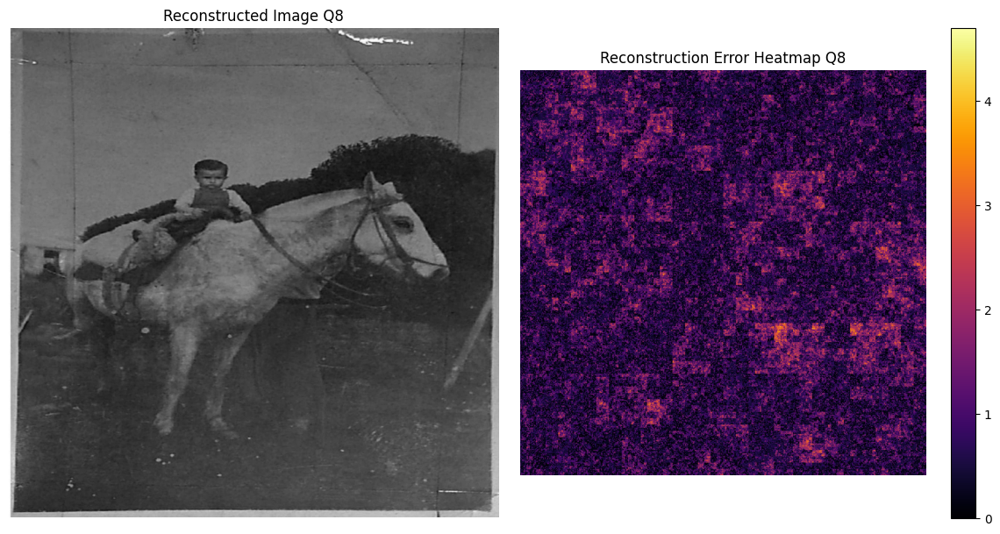

Mean absolute reconstruction error (MAE) Q8: 0.787851
Mean squared reconstruction error (MSRE) Q8: 0.979885
Quantization 6 bits per sample
blob size 1048666 bytes Quantized.


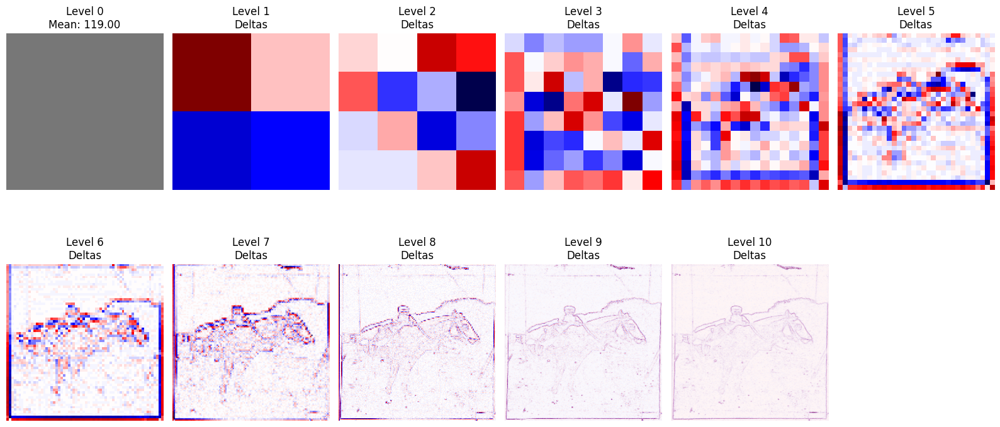

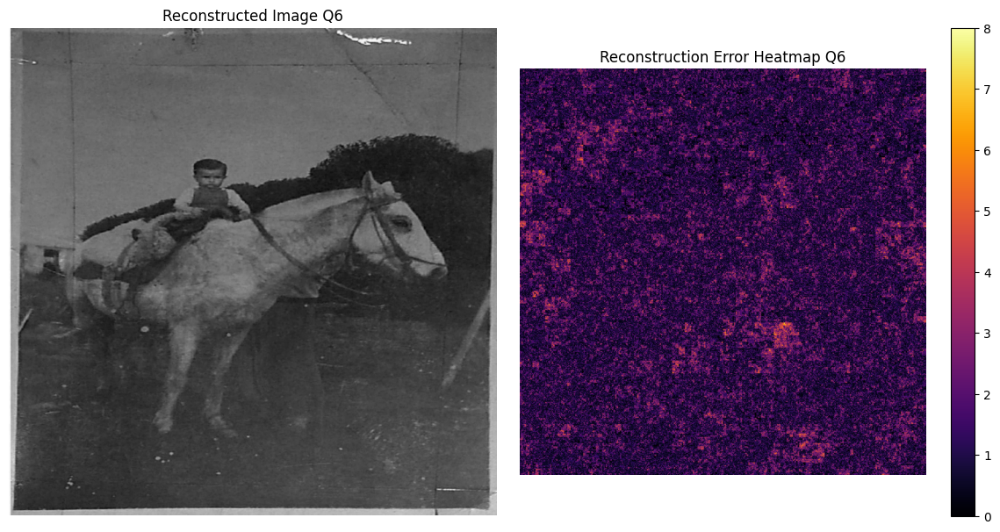

Mean absolute reconstruction error (MAE) Q6: 1.282070
Mean squared reconstruction error (MSRE) Q6: 2.569172
Quantization 4 bits per sample
blob size 699141 bytes Quantized.


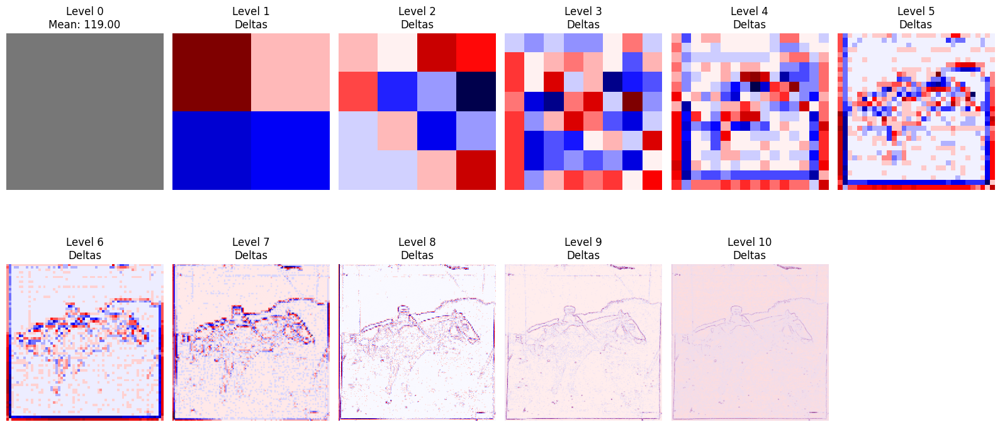

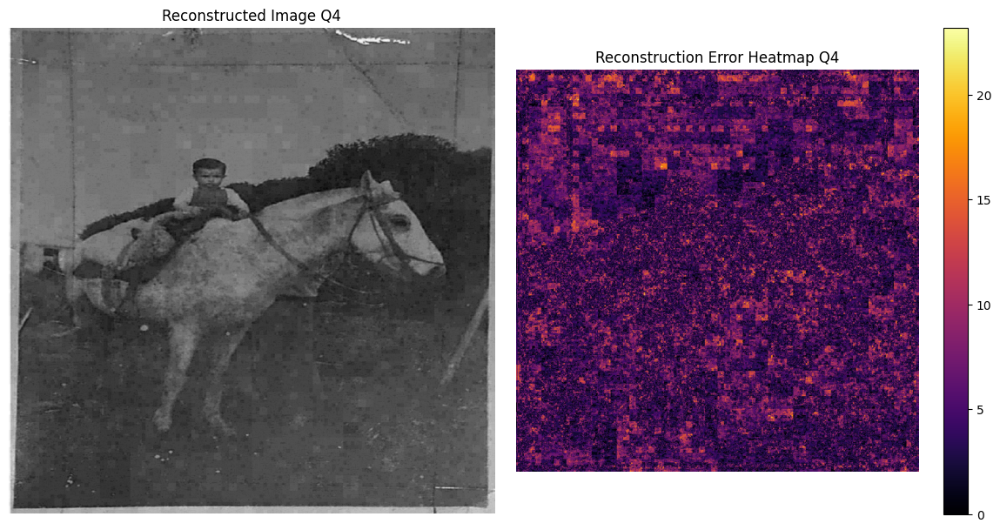

Mean absolute reconstruction error (MAE) Q4: 5.035160
Mean squared reconstruction error (MSRE) Q4: 37.020340
Quantization 2 bits per sample
blob size 349616 bytes Quantized.


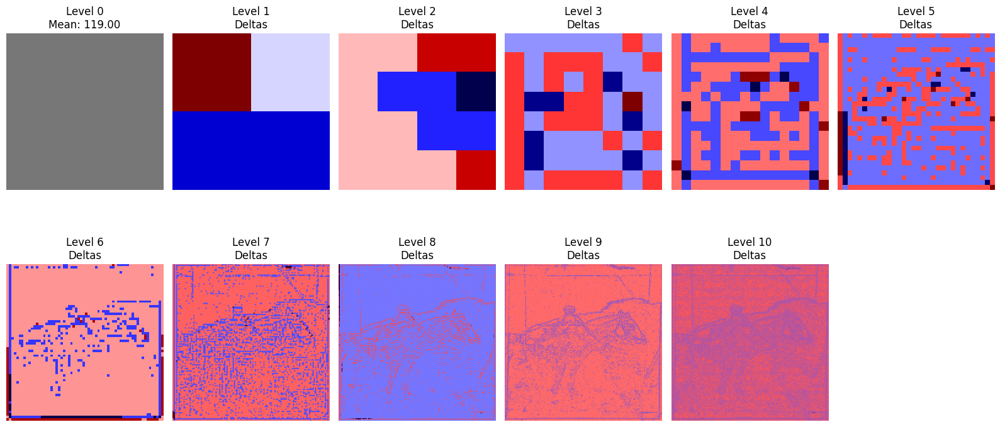

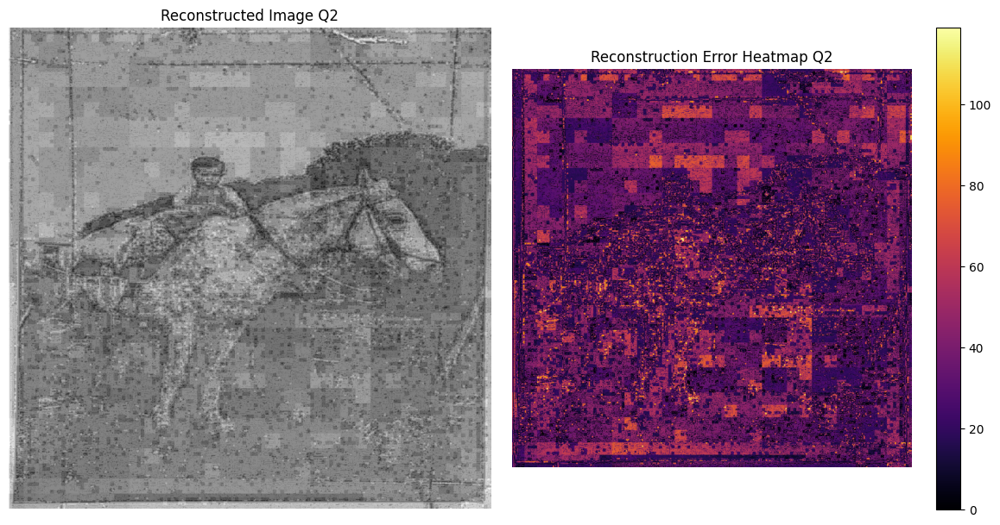

Mean absolute reconstruction error (MAE) Q2: 31.652096
Mean squared reconstruction error (MSRE) Q2: 1384.250610
Quantization 1 bits per sample
blob size 174854 bytes Quantized.


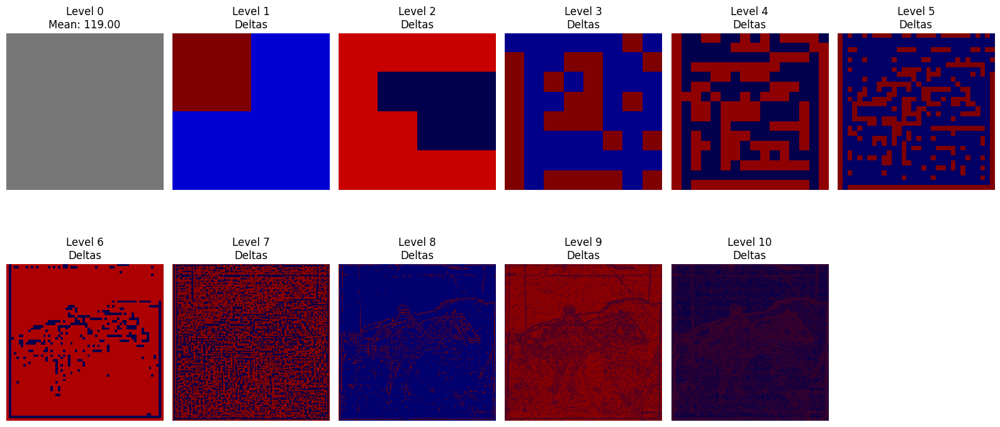

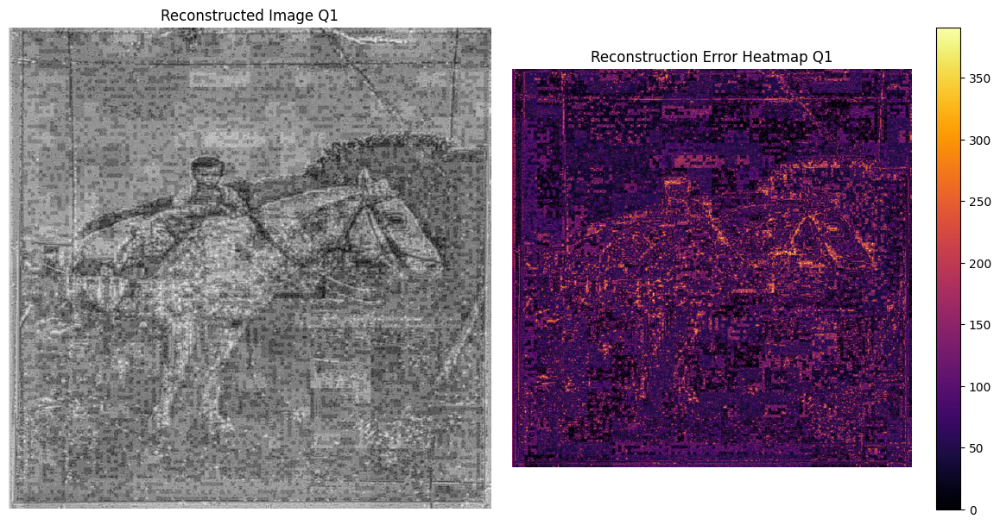

Mean absolute reconstruction error (MAE) Q1: 78.491005
Mean squared reconstruction error (MSRE) Q1: 10090.714844
{'Qbits': 8, 'lenblobQ': 1398191, 'mae': np.float32(0.78785145), 'msre': np.float32(0.97988534)}
{'Qbits': 6, 'lenblobQ': 1048666, 'mae': np.float32(1.2820696), 'msre': np.float32(2.5691724)}
{'Qbits': 4, 'lenblobQ': 699141, 'mae': np.float32(5.0351596), 'msre': np.float32(37.02034)}
{'Qbits': 2, 'lenblobQ': 349616, 'mae': np.float32(31.652096), 'msre': np.float32(1384.2506)}
{'Qbits': 1, 'lenblobQ': 174854, 'mae': np.float32(78.491005), 'msre': np.float32(10090.715)}


In [4]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image

def pack_bits(arr: np.ndarray, b: int) -> bytearray:
    """
    Pack a flat array of unsigned integers (0 <= v < 2^b) into a bytearray.
    """
    flat = arr.flatten().astype(np.uint32)
    bitstream = 0
    bits_in = 0
    out = bytearray()
    for v in flat:
        bitstream |= (int(v) << bits_in)
        bits_in += b
        while bits_in >= 8:
            out.append(bitstream & 0xFF)
            bitstream >>= 8
            bits_in    -= 8
    if bits_in:
        out.append(bitstream & 0xFF)
    return out


def unpack_bits(blob: bytes, count: int, b: int) -> np.ndarray:
    """
    Unpack `count` values each of `b` bits from a byte stream.
    Returns a length-`count` uint32 array.
    """
    vals = np.zeros(count, dtype=np.uint32)
    bitstream = 0
    bits_in = 0
    byte_idx = 0
    for idx in range(count):
        while bits_in < b:
            bitstream |= (blob[byte_idx] << bits_in)
            bits_in  += 8
            byte_idx += 1
        vals[idx] = bitstream & ((1 << b) - 1)
        bitstream >>= b
        bits_in    -= b
    return vals


def encode(image: np.ndarray) -> list:
    assert image.ndim == 2 and image.shape[0] == image.shape[1]
    N = image.shape[0]
    max_level = int(np.log2(N))
    levels = []
    averages = []

    # Level 0
    avg0 = np.mean(image)
    levels.append(avg0)
    averages.append(np.array([[avg0]]))

    for level_idx in range(1, max_level + 1):
        size = 1 << level_idx
        block = N // size
        avgs = np.zeros((size, size), dtype=np.float32)
        deltas = np.zeros_like(avgs)
        for i in range(size):
            ib, i1b, i2 = i*block, (i+1) * block, i >> 1
            for j in range(size):
                sub = image[ib:i1b, j*block:(j+1)*block]
                block_avg = np.mean(sub)
                avgs[i,j] = block_avg
                parent = averages[level_idx-1][i2, j >> 1]
                deltas[i,j] = block_avg - parent
        levels.append(deltas)
        averages.append(avgs)
    return levels


def encode_to_blob_quantized(levels: list, bits_per_level: list=None, epsilon: float=0.0) -> bytes:
    """
    Quantize each delta layer to b bits, pack, and LZMA-compress the full blob.
    Returns the compressed byte string.
    """
    blob = bytearray()
    # Level 0
    blob.append(int(round(levels[0])) & 0xFF)
    L = len(levels)

    for level_idx in range(1, L):
        deltas = levels[level_idx]
        # threshold
        if epsilon > 0:
            mask = np.abs(deltas) < epsilon
            deltas = deltas.copy()
            deltas[mask] = 0

        b = bits_per_level[level_idx-1]
        mn, mx = deltas.min(), deltas.max()
        scale = (mx - mn) / ((1 << b) - 1) if mx != mn else 1.0

        # header: mn, scale as floats
        blob.extend(np.float32(mn).tobytes())
        blob.extend(np.float32(scale).tobytes())
        blob.append(b)

        # quantize and pack
        q = np.round((deltas - mn) / scale).astype(np.uint32)
        packed = pack_bits(q, b)
        blob.extend(packed)

    return blob


def decode_from_blob_quantized(blob: bytes, img_size: int) -> list:
    """
    Decompress and decode blob back to levels list.
    """
    pos = 0
    levels = []

    # level 0
    avg0 = float(blob[pos]); pos += 1
    levels.append(avg0)

    max_level = int(np.log2(img_size))
    for level_idx in range(1, max_level+1):
        mn = np.frombuffer(blob[pos:pos+4], dtype=np.float32)[0]; pos+=4
        scale = np.frombuffer(blob[pos:pos+4], dtype=np.float32)[0]; pos+=4
        b = blob[pos]; pos+=1

        size = 1 << level_idx
        count = size * size
        # estimate bytes needed for packed data
        bits_total = count * b
        bytes_total = (bits_total + 7) >> 3
        packed = blob[pos:pos+bytes_total]
        pos += bytes_total

        flat = unpack_bits(packed, count, b)
        deltas = mn + flat.astype(np.float32) * scale
        levels.append(deltas.reshape((size,size)))

    return levels


def decode(levels: list) -> np.ndarray:
    # Reconstruct full image averages at final level
    max_level = len(levels)
    size = 1 << (max_level-1)
    rec = np.zeros((size,size), dtype=np.float32)

    # Build avgs levels
    prev = np.array([[levels[0]]], dtype=np.float32)
    for level_idx in range(1, max_level):
        cur = np.zeros_like(levels[level_idx])
        for i in range(cur.shape[0]):
            i2 = i >> 1
            for j in range(cur.shape[1]):
                parent = prev[i2,j >> 1]
                cur[i,j] = parent + levels[level_idx][i,j]
        prev = cur
    # Each cell cur[i,j] now is the average of that block; expand to pixels:
    return prev.copy()


def encode_to_blob(levels):
    """
    Convert encoded levels into a single byte blob.
    Assumes:
    - levels[0] is a scalar average (float)
    - levels[1..] are delta arrays (floats, possibly negative)
    Converts each layer to uint8 with quantization.
    """

    blob = bytearray()

    # Layer 0: single average -> map [0..255] to byte directly
    avg0 = levels[0]
    byte0 = np.clip(np.round(avg0), 0, 255).astype(np.uint8)
    blob.append(byte0)

    # For each delta layer
    for level_idx in range(1, len(levels)):
        deltas = levels[level_idx]
        # Deltas can be negative, so offset by +128 to fit into 0..255
        deltas_offset = deltas + 128
        deltas_clipped = np.clip(np.round(deltas_offset), 0, 255).astype(np.uint8)
        # Flatten and extend the blob
        blob.extend(deltas_clipped.flatten())

    return blob


def decode_from_blob(blob, img_shape):
    """
    Decode the byte blob back to levels.
    Returns list levels: [avg0 (float), delta arrays (float arrays)]
    Assumes fixed sizes by layer.
    """

    levels = []
    pos = 0

    # Layer 0: 1 byte
    avg0_byte = blob[pos]
    pos += 1
    avg0 = float(avg0_byte)
    levels.append(avg0)

    # Number of layers = log2 of image size + 1
    # We need to guess or pass the total levels or image size.
    # Here, let's assume user passes or you know max_level:
    max_level = int(np.log2(img_shape))  # from your original image shape

    for level_idx in range(1, max_level + 1):
        size = 1 << level_idx
        count = size * size
        layer_bytes = blob[pos:pos + count]
        pos += count
        # Convert bytes back to floats and offset back -128
        deltas = np.array(list(layer_bytes), dtype=np.float32) - 128
        deltas = deltas.reshape((size, size))
        levels.append(deltas)

    return levels


def show_encoded_levels(levels, Q=8):
    """
    Display each level as an image (for visualization).
    """
    num_levels = len(levels)
    plt.figure(figsize=(16, 8))

    for idx, level in enumerate(levels):
        plt.subplot(2, (num_levels + 1) >> 1, idx + 1)
        if idx == 0:
            square = np.full((32, 32), levels[0])
            plt.imshow(square, cmap='gray', vmin=0, vmax=255)
            plt.title(f"Level 0\nMean: {levels[0]:.2f}")
        else:
            data = level
            vmax = np.max(np.abs(data))
            plt.imshow(data, cmap='seismic', vmin=-vmax, vmax=vmax)
            plt.title(f"Level {idx}\nDeltas")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


def main():
  GDpath ='/content/drive/MyDrive'
  # Load an image file (replace 'your_image.png' with your image filename)
  img_path = f'{GDpath}/GFX/1514774562833.jpg'
  size_in_bytes = os.path.getsize(img_path)
  print(f"File size: {size_in_bytes} bytes")
  img_pil = Image.open(img_path).convert('L')

  N = img_pil.size[0]
  if img_pil.size[0] != img_pil.size[1] or (N & (N - 1)) != 0:
    target_size = 1024
    print(f"Resizing image from {img_pil.size} to ({target_size},{target_size})")
    img_pil = img_pil.resize((target_size, target_size), Image.BILINEAR)

  img = np.array(img_pil).astype(np.float32)

  # Encode
  levels = encode(img)
  blob = encode_to_blob(levels)
  print(f"blob size {len(blob)} bytes.")
  levels = decode_from_blob(blob, img.shape[0])
  lv = len(levels)
  reconstructed = decode(levels)

  # Visualize encoded levels
  show_encoded_levels(levels)

  # Show original vs reconstructed
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 3, 1)
  plt.title("Original Image")
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title("Reconstructed Image")
  plt.imshow(reconstructed, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.imshow(np.abs(img - reconstructed), cmap='inferno')
  plt.colorbar()
  plt.title('Reconstruction Error Heatmap')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

  # Compute errors
  # Print mean absolute reconstruction error
  error_mae = np.mean(np.abs(img - reconstructed))
  error_msre = np.mean((img - reconstructed) ** 2)
  print(f"Mean absolute reconstruction error (MAE): {error_mae:.6f}")
  print(f"Mean squared reconstruction error (MSRE): {error_msre:.6f}")

  # Quantized version
  Quants = []

  for Qbits in [8,6,4,2,1]:

    print(f"Quantization {Qbits} bits per sample")
    blobQ = encode_to_blob_quantized(levels, bits_per_level=[Qbits]*lv)
    print(f"blob size {len(blobQ)} bytes Quantized.")
    levelsQ = decode_from_blob_quantized(blobQ, img.shape[0])
    reconstructedQ = decode(levelsQ)

    show_encoded_levels(levelsQ, Qbits)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title(f"Reconstructed Image Q{Qbits}")
    plt.imshow(reconstructedQ, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.abs(img - reconstructedQ), cmap='inferno')
    plt.colorbar()
    plt.title(f'Reconstruction Error Heatmap Q{Qbits}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Compute errors
    # Print mean absolute reconstruction error
    error_mae = np.mean(np.abs(img - reconstructedQ))
    error_msre = np.mean((img - reconstructedQ) ** 2)
    print(f"Mean absolute reconstruction error (MAE) Q{Qbits}: {error_mae:.6f}")
    print(f"Mean squared reconstruction error (MSRE) Q{Qbits}: {error_msre:.6f}")
    Quants.append({'Qbits':Qbits,'lenblobQ':len(blobQ), 'mae':error_mae, 'msre':error_msre})

  for Qstat in Quants:
    print(Qstat)

main()